# Bevaringslover og transportligning

Her fokuserer vi på ligninger av type
$$
u_t + a(x,t,u) u_x = 0
$$

og den tilsvarende bevaringslov

$$
u_t + \big( f(u) \big)_x = 0
$$

## 1. Upwind, downwind, og karakteristikker

La oss begynne med den konstant hastighet ligning

$$
u_t + au_x = 0, \quad u(x,0)=g(x),
$$

som har en analytisk løsning $u(t,x)=g(x-at)$. Legg merke til at det betyr at $u(t,x)$ er kun avhengig av initialbetingelse på et punkt, $x-at$.

Vi ønsker å kombinere Eulers metode

$$
u(t_{n+1}) = u(t_n) - k a u_x(t_n) 
$$

Med en tilnærming til $u_x$. Husk fra 6_1 at det finnes tre naturlige måter å tilnærme $\big(u_m(t)\big)_x = u_x(t, x_m)$, nemlig

1. Forlengs differanser

$$
(u_m)_x \approx \frac{u_{m+1}-u_m}{h}
$$


2. Baklengs differanser

$$
(u_m)_x \approx \frac{u_{m}-u_{m-1}}{h}
$$

3. Sentrale differanser
$$
(u_m)_x \approx \frac{u_{m+1}-u_{m-1}}{2h}
$$

Det viser seg at bare en er rimelig for vår ligning, hvis vi bruker Eulers metode i tid! Sjekk det med å kode i feltet under.

0.1231155778894471


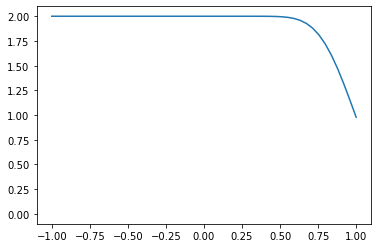

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation

# koder forlengs metoden
# a hastighet
# fb randbetingelser på høyre side, en funksjon av tid
# h steglengde i rom
# k steglengde i tid
# t nåværende tid
# x0 nåværende status, altså u(x_m)
# return x1, status på neste tidspunkt, altså u(x_m+1)

def forlengs(a, fb, x0, h, k, t):
    n = x0.size
    x1 = np.zeros(n)
    for i in np.arange(0,n-1):
        x1[i] = (1 + a*k/h)*x0[i] - (a*k/h)*x0[i+1]
    x1[-1] = fb(t)
    return x1

# baklengs metoden
# fa randbetingelser på venstre side, en funksjon av tid

def baklengs(a, fa, x0, h, k, t):
    n = x0.size
    x1 = np.zeros(n)
    for i in np.arange(1,n):
        x1[i] = (1 - a*k/h)*x0[i] + (a*k/h)*x0[i-1]
    x1[0] = fa(t)
    return x1

# sentrale differanser-metoden
# trenger både fa og fb, randbetingelser på henholdsvis høyre og venstre

def sentrale(a, fa, fb, x0, h, k, t):
    n = x0.size
    x1 = np.zeros(n)
    for i in np.arange(1,n-1):
        x1[i] = x0[i] + (a*k/(2*h))*x0[i-1] - (a*k/(2*h))*x0[i+1]
    x1[0] = fa(t)
    x1[-1] = fb(t)
    return x1

# randbetingelser venstre side

def fa(x):
    return 2

# randbetingelser høyre side

def fb(x):
    return 0

# setter hastighet a

hastighet = 1

# setter opp gitteret med punkter i tid og rom
# 200 punkter mellom 0 og 1 i tid
# 50 punkter mellom 1 og -1 i rom

T = 1
n = 200

a = -1
b = 1
m = 50

t = np.linspace(0,T,n)
x = np.linspace(a,b,m)

# beregn k og h

k = t[1]-t[0]
h = x[1]-x[0]

# initialiserer u
u = np.zeros((n,m))

# initialbetingelser - lik 2 for x<0 og 0 for x>0
u[0,:] = 1-np.sign(x)

# sjekker a*k/h
# må være under 1 om baklengs-metoden skal funke
print(hastighet*k/h)

# fjern kommentarer fra metoden du vil bruke

for i in np.arange(1,n):
#    u[i,:] = forlengs(hastighet, fb, u[i-1,:],h,k,t[i])
    u[i,:] = baklengs(hastighet, fa, u[i-1,:],h,k,t[i])
#    u[i,:] = sentrale(hastighet, fa, fb, u[i-1,:],h,k,t[i])    
    
fig, ax = plt.subplots()

line, = ax.plot(x, u[0,:])

def animate(i):
    line.set_ydata(u[i,:])
    return line,

ani = animation.FuncAnimation(fig, animate, interval=20, blit=True, save_count=t.size)

from IPython.display import HTML
HTML(ani.to_jshtml())

### a) Hvorfor gikk det galt?

Hvorfor gikk det så galt for to strategier som virker rimelig? La oss tenke på karakteristikkene. Skriv $u^n_m = u(t_n, x_m)$. Metodene er


1. Forlengs
$$
u^{n+1}_m = (1 + \frac{ak}{h}) u^n_m - \frac{ak}{h} u^n_{m+1}
$$

2. Baklengs
$$
u^{n+1}_m = (1 - \frac{ak}{h}) u^n_m + \frac{ak}{h} u^n_{m-1}
$$

3. Sentrale
$$
u^{n+1}_m = u^n_m + \frac{ak}{2h} u^n_{m-1} - \frac{ak}{2h} u^n_{m+1}
$$

Antar for tiden at $a>0$.

I tilfelle 1 ser vi at verdien til $u^{n+1}_m$ er bare avhengig av verdiene $u^n_m$ og $u^n_{m+1}$, altså verdiene til høyre for $x_m$. 

Sporer vi tilbake til $n=0$ ser vi at $u^{n+1}_m$ er avhengig av $g(x), x_m \leq x \leq x_{m+n+1}$. Men den eksakte løsningen $u(x_m, t_{n+1})$ er lik $g(x_m - at_{n+1})$, som er utenfor det området! Det er ingen måte at det kan gå opp.

Om vi velger metode 2 derimot, er $u^{n+1}_m$ er avhengig av $g(x), x_{m-n-1} \leq x \leq x_m$. Vi trenger ikke fortvile så lenge at $x_m - at_{n+1}$ befinner seg i intervallet. Det går opp så lenge $h (n-1) > ak (n+1)$

altså

$$
\frac{ak}{h} < 1
$$

### b) Om $a<0$

Metode 2 kalles for en *upwind* metode om $a>0$. Overbevis deg selv at ting er omvendt hvis $a<0$, dvs da er det kun metode 1 som funker, og som får hete *upwind*. Tegn gjerne et bilde som viser karakterstikkene.

### c) Sentraledifferanser og Lax-Friedrichs

Det forklarer imidlertidig ikke hvorfor sentraledifferanser ikke funker. Det er langt vanskeligere å komme på en intuitiv forklaring på. Det viser seg at en nær beslektet metode som bruker sentrale differanser,

$$
u^{n+1}_m = \frac{1}{2}(u^n_{m+1} + u^n_{m-1}) + \frac{ak}{2h} u^n_{m-1} - \frac{ak}{2h} u^n_{m+1}
$$

faktisk funker. Det heter **Lax-Friedrichs metode**. Det er på mange måte mindre effektiv en den upwind metode, men vi trenger ikke være obs på fortegnet til $a$. Det er en triviell fordel for den enkle problemstilling her, men plutselig langt mer betydningsfullt om $a(x,t,u)$ er ikke konstant.

I fortsettelse fokuserer vi på denne metode, anvendt på mer generelle bevaringslover.

### d) Randbetingelser

Hva slags randbetingelser trenger vi?

Upwind metode trenger bare randbetingelser på upwind side. For eksempel, for å anvende metode 2 på en ligning med $a>0$, savner vi en metode for å beregne $u_0^{n+1}$, da den trenger $u_{-1}^n$ som er utenfor området. Vi setter altså

$$
u^{n+1}_0 = u(x_0,t_{n+1}) = h_1(t_{n+1}),
$$

hvor $h(t)$ er den oppgitte upwind randbetingelse.

På lik linje ville downwind metode trengte heller en randbetingelse på den andre side, altså 

$$
u^{n+1}_m = u(x_m,t_{n+1}) = h_2(t_{n+1}),
$$

Sentraledifferanser og Lax-Friedrichs krever randbetingelser på begge sider. Det virker å gå imot det som vi sa i 5_2, nemlig at vi trengte bare randbetingelser på upwind-side. Egentlig er det et problem med disse metoder, men det viser seg at vi kan ofte gjette noe rimelig, f eks vi kan ta 

$$
h_2(t) = h_2 = g(x_m),
$$

hvor vi antar at $u$ er konstant på den downwide side og lik initialverdien der.

## 2. Lax-Friedrichs metode og Bevaringslover

Vi vender nå blikket mot bevaringslover, 

$$
u_t + \big( f(u) \big)_x = 0
$$

Det er mulig å finne på en metode som tilsvarer upwind metoden (den heter Godunov metoden), men det krever at vi løser karakteristiske ligninger for å vite hvilken retning er "upwind" til enhver tid og sted. Derfor er den letteste metoden som funker Lax-Friedrichs metoden:

$$
u^{n+1}_m = \frac{1}{2}(u^n_{m+1} + u^n_{m-1}) - \frac{k}{2h}\big(f(u^n_{m+1})-f(u^n_{m-1})\big)
$$

**Oppgave:** Sjekk at metoden oppgitt under samme navn for den konstant hastighet ligning er et spesieltilfelle hvor $f(u)=au$.

## Eksempel: Burgers ligning

Mange modeller følger

$$
u_t + f(u)_x = 0
$$

Enkleste eksempel er Burgers ligning
$$
u_x + u u_x = \epsilon u_{xx},
$$

hvor $\epsilon\rightarrow 0$. De er det samme hvis $f(u) = \frac{1}{2}u^2$, men hvor har $\epsilon$ kommet fra? Den er fant opp, men har en viktig rolle å spille. Det kalles for viskositet etter analogi fra fluidmekanikk. I noen prosjekter vil dere undersøke det nærmere.

Vi viser under forskjellige typer oppførsel for Lax-Friedrichs metode, hvor $\epsilon=0$.



In [2]:
# Fluks for Burgers ligning
def f(x):
    return 0.5*(x**2)

# Lax-Friedrichs metode
# fluks er en funksjon, vi kommer til å bruke f for Burgers ligning
# fa og fb er funksjoner av tid, og er randbetingelsene på henholdsvis høyre og venstre side
# h steglengde i rom
# k steglengde i tid
# t nåværende tid
# x0 nåværende status, altså u(x_m)
# return x1, status på neste tidspunkt, altså u(x_m+1) 

def lf(fluks, fa, fb, x0, h, k, t):
    n = x0.size
    x1 = np.zeros(n)
    # for-løkka som setter inn verdiene vi trenger
    for i in np.arange(1,n-1):
        x1[i] = (x0[i-1] + x0[i+1])/2 - (k/h)*(fluks(x0[i+1])-fluks(x0[i-1]))
    # randbetingelser på venstre
    x1[0] = fa(t)
    # randbetingelser på høyre
    x1[-1] = fb(t)
    return x1

# setter opp gitteret med punkter i tid og rom
# 200 punkter mellom 0 og 1 i tid
# 100 punkter mellom 1 og -1 i rom

T = 1
n = 200

a = -1
b = 1
m = 100

t = np.linspace(0,T,n)
x = np.linspace(a,b,m)

# finner stegslengde i tid
k = t[1]-t[0]
# finner stegslengde i rom
h = x[1]-x[0]

### a) En sjokk oppstår

La oss begynne med en fin, glatt initialverdi, som $u(x,0) = \exp(-x^2)$. Vi kommer til å møte et problem, siden toppen av bølgen ved $x=0$ beveger seg til høyre mye fortere enn de delene foran seg. Se video:

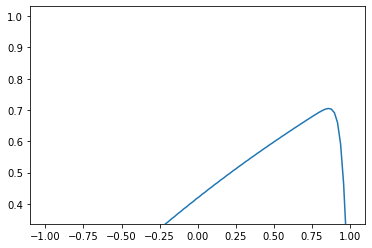

In [11]:
# randbetingelse på venstre side
def fa(x):
    return 0

# randbetingelse på høyre side
def fb(x):
    return 0

u = np.zeros((n,m))

# initialverdien
u[0,:] = np.exp(-(x**2))

for i in np.arange(1,n):
    u[i,:] = lf(f, fa, fb, u[i-1,:],h,k,t[i])
    
fig, ax = plt.subplots()

line, = ax.plot(x, u[0,:])

def animate(i):
    line.set_ydata(u[i,:])
    return line,

ani = animation.FuncAnimation(fig, animate, interval=20, blit=True, save_count=t.size)

HTML(ani.to_jshtml())

Den eksakte løsningen utvikler en hopp, som vi kaller for en **sjokk**. Den er assosiert med fenomenet av at karakteristikker krysser hverandre.

Men hva er egentlig den eksakte løsningen? La oss se på nytt på de to eksemplene fra 5_2, hvor vi har tegnet karakteristikkene. Vi tok initialverdiene

**Sjokk**
$$
g(x) = \left\{
\begin{array}[cc]
&0 \quad & x\leq 0 \\
-1 \quad & x>0
\end{array}
\right.
$$

og 

**Fortynningsbølge**
$$
g(x) = \left\{
\begin{array}[cc]
&-1 \quad & x\leq 0 \\
0 \quad & x>0
\end{array}
\right.
$$

### b) En sjokk i fart

Vi løser den første situasjon med Lax-Friedrichs metode.

Sofistikerte analytiske metoder sier at løsning skal være at hoppen flytter til høyre med konstant hastighet. Det er imidlertidig ikke noe som man får ut av ligningen alene, man må legge til ekstra fysiske antagelser, typisk i form av såkalte *entropibetingelser*. 

Heldigvis ser det ut som at vår metode har gitt noe rimelig når det vi ønsket seg.

Legg merke til at den numeriske metode ikke gir et rent hopp, men heller en glatt overgang. Det tilsvarer oppførselen til den eksakte løsningen av ligningen

$$
u_x + u u_x = \epsilon u_{xx},
$$

for en liten, men ikke null $\epsilon$ (vi kaller det for numerisk viskositet). Det forklarer hvorfor vi sa $\epsilon\rightarrow 0$ og ikke $\epsilon = 0$ i innledningen. Den grenseverdien kan brukes som et alternativ til entropibetingelser for å definere hva løsningen skal være under sjokk. Det finnes mye litteratur om slik *viskositetsløsninger*.

**Den gode nyheter**: entropiløsninger og viskositetsløsninger er vanskelig, men beskjeden er at vi kan stort sett gi blaffen i det og stole på at numeriske metoder gir oss det vi ønsker.

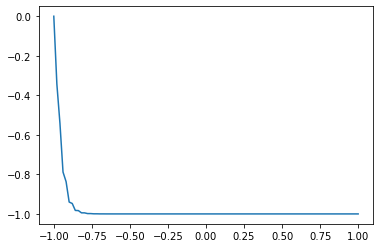

In [23]:
# randbetingelser på venstre side
def fa(x):
    return 0

# randbetingelser på høyre side
def fb(x):
    return -1

u = np.zeros((n,m))

# initialverdien
u[0,:] = -1+0.5*(1-np.sign(x))

for i in np.arange(1,n):
    u[i,:] = lf(f, fa, fb, u[i-1,:],h,k,t[i])
    
fig, ax = plt.subplots()

line, = ax.plot(x, u[0,:])

def animate(i):
    line.set_ydata(u[i,:])
    return line,

ani = animation.FuncAnimation(fig, animate, interval=20, blit=True, save_count=t.size)

HTML(ani.to_jshtml())

### c) Fortynningsbølge

En annen viktig type oppførsel skjer når karaktarestikkene går heller fra hverandre. Vi kan se det ved å la $u(x,0)$ være negativ for $u<0$ og positiv for $u>0$. Det er en fortynningsbølge eller ekspansjon.

Det samme kommentar gjelder som med sjokk: også her kan vi stole på at den numeriske løsninger er det vi ønsker oss.

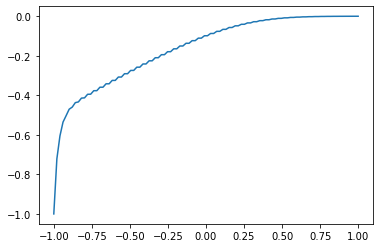

In [15]:
# randbetingelse på venstre side
def fa(x):
    return -1

# randbetingelse på høyre side
def fb(x):
    return 0

# initialverdien
u[0,:] = -0.5*(1-np.sign(x))

for i in np.arange(1,n):
    u[i,:] = lf(f, fa, fb, u[i-1,:],h,k,t[i])
    
fig, ax = plt.subplots()

line, = ax.plot(x, u[0,:])

def animate(i):
    line.set_ydata(u[i,:])
    return line,

ani = animation.FuncAnimation(fig, animate, interval=20, blit=True, save_count=t.size)

HTML(ani.to_jshtml())